### In this notebook we try to create a baseline model using player statistics in every match to predict the scoreline of a match. We observed some stastics are directed related to goals by the players so we need to change the approach for training the model. We will take average stats of the player for all the matches he played in EPL to use as predictors in next notebooks. 

In [1]:
import pandas as pd

In [3]:
# first we load train set match IDs from did and match_list from pickle files
import pickle
with open('train_set_2425.pkl', 'rb') as f:
    train_set = pickle.load(f)

In [4]:
train_set['Arsenal_Wolves_1_20240817_H']

{'team1': 'Arsenal',
 'team2': 'Wolves',
 'date': '20240817',
 'round': '1',
 'homeaway': 'H',
 'team1_players': [{'player_name': 'Ben White',
   'stats_path': '../../../MusicRecMix/tracks/tracksharepoint/National University of Singapore/Sandesh Sreepathy Upadhyaya - Football Dataset/2425_FINAL/Arsenal/Ben White/summary.json'},
  {'player_name': 'Bukayo Saka',
   'stats_path': '../../../MusicRecMix/tracks/tracksharepoint/National University of Singapore/Sandesh Sreepathy Upadhyaya - Football Dataset/2425_FINAL/Arsenal/Bukayo Saka/summary.json'},
  {'player_name': 'David Raya',
   'stats_path': '../../../MusicRecMix/tracks/tracksharepoint/National University of Singapore/Sandesh Sreepathy Upadhyaya - Football Dataset/2425_FINAL/Arsenal/David Raya/summary.json'},
  {'player_name': 'Declan Rice',
   'stats_path': '../../../MusicRecMix/tracks/tracksharepoint/National University of Singapore/Sandesh Sreepathy Upadhyaya - Football Dataset/2425_FINAL/Arsenal/Declan Rice/summary.json'},
  {'pl

In [ ]:
idx = 'Arsenal_Wolves_1_20240817_H'
xd = pd.read_json(train_set['Arsenal_Wolves_1_20240817_H']['team1_players'][0]['stats_path'])
xd[xd.apply(lambda row: f"{row['Squad']}_{row['Opponent']}_{row['Round'].split(' ')[1]}_{str(row['Date'].date()).replace('-', '')}_{row['Venue'][0]}" == idx, axis=1)]

,Date,Day,Comp,Round,Venue,Result,Squad,Opponent,Start,Pos,...,SCA,GCA,Cmp,Att,Cmp%,PrgP,Carries,PrgC,Succ,Match Report
0,2024-08-17,Sat,Premier League,Matchweek 1,Home,W 2–0,Arsenal,Wolves,Y,RB,...,3,0,38,1,82.6,6,33,0,0,Match Report


In [ ]:
xd[['Start', 'Pos', 'Min', 'Gls', 'Ast', 'PK', 'PKatt', 'Sh', 'SoT', 'CrdY',
       'CrdR', 'Touches', 'Tkl', 'Int', 'Blocks', 'xG', 'npxG', 'xAG', 'SCA',
       'GCA', 'Cmp', 'Att', 'Cmp%', 'PrgP', 'Carries', 'PrgC']]

,Start,Pos,Min,Gls,Ast,PK,PKatt,Sh,SoT,CrdY,...,xAG,SCA,GCA,Cmp,Att,Cmp%,PrgP,Carries,PrgC,Succ
0,Y,RB,90,0,0,0,0,2,1,0,...,0.0,3,0,38,1,82.6,6,33,0,0
1,Y,RB,90,0,0,0,0,0,0,0,...,0.0,0,0,61,0,91.0,8,45,1,0
2,Y,"RB,CB",90,0,0,0,0,1,0,0,...,0.0,1,0,20,0,71.4,3,18,0,0
3,Y,RB,90,0,0,0,0,0,0,0,...,0.0,0,0,31,1,81.6,1,11,0,0
4,N,CB,45,0,0,0,0,0,0,0,...,0.0,0,0,3,0,100.0,1,2,0,0
5,Y,RB,90,0,0,0,0,0,0,1,...,0.0,0,0,31,0,81.6,0,20,1,0
6,Y,CB,90,0,1,0,0,0,0,0,...,0.2,1,1,46,0,88.5,4,27,0,0
7,N,"LB,CB",20,0,0,0,0,0,0,0,...,0.0,1,0,27,0,79.4,3,17,2,0
8,Y,RB,90,0,0,0,0,1,0,1,...,0.2,2,0,37,0,80.4,4,20,0,0
9,N,"On matchday squad, but did not play",Match Report,,,,,,,,...,,,,,,,,,,


In [ ]:
#create a x df, y df for model training
# for each match ID, player id, team name, player stats : xdf
# for each match iD, formations, results : ydf

In [5]:
xdf = None
ydf = None
feats = ['Start', 'Pos', 'Min', 'Gls', 'Ast', 'PK', 'PKatt', 'Sh', 'SoT', 'CrdY',
       'CrdR', 'Touches', 'Tkl', 'Int', 'Blocks', 'xG', 'npxG', 'xAG', 'SCA',
       'GCA', 'Cmp', 'Att', 'Cmp%', 'PrgP', 'Carries', 'PrgC']
for match_id, match_info in train_set.items():
    for team_key in ['team1_players', 'team2_players']:
        team_name = match_info['team1'] if team_key == 'team1_players' else match_info['team2']
        for player_info in match_info[team_key]:
            player_stats_df = pd.read_json(player_info['stats_path'])
            if team_key == 'team1_players':
                player_stats_df = player_stats_df[player_stats_df.apply(lambda row: f"{row['Squad']}_{row['Opponent']}_{row['Round'].split(' ')[1]}_{str(row['Date'].date()).replace('-', '')}_{row['Venue'][0]}" == match_id, axis=1)]
            else:
                player_stats_df = player_stats_df[player_stats_df.apply(lambda row: f"{row['Opponent']}_{row['Squad']}_{row['Round'].split(' ')[1]}_{str(row['Date'].date()).replace('-', '')}_{'A' if row['Venue'][0] == 'H' else 'H'}" == match_id, axis=1)]
            player_stats_filtered = player_stats_df[feats]
            player_stats_filtered['player_name'] = player_info['player_name']
            player_stats_filtered['match_id'] = match_id
            player_stats_filtered['team'] = team_name
            if xdf is None:
                xdf = player_stats_filtered
            else:
                xdf = pd.concat([xdf, player_stats_filtered], ignore_index=True)
    
    match_result = {
        'match_id': match_id,
        'team1': match_info['team1'],
        'team2': match_info['team2'],
        # 'formation_team1': match_info['formation_team1'],
        # 'formation_team2': match_info['formation_team2'],
        'result_team1': match_info['result'], # convert to 1 if Win, 0 if Draw, -1 if Lose
        'scoreline': match_info['scoreline']
    }
    match_result_df = pd.DataFrame([match_result])
    if ydf is None:
        ydf = match_result_df
    else:
        ydf = pd.concat([ydf, match_result_df], ignore_index=True)

/tmp/ipykernel_55002/3501568987.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_stats_filtered['player_name'] = player_info['player_name']
/tmp/ipykernel_55002/3501568987.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_stats_filtered['match_id'] = match_id
/tmp/ipykernel_55002/3501568987.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https

In [6]:
ydf.shape, xdf.shape

((380, 5), (13075, 29))

In [56]:
xdf.to_csv('train_xdf.csv', index=False)
ydf.to_csv('train_ydf.csv', index=False)

In [7]:
xdf[(xdf['match_id'] == 'Leicester City_Southampton_35_20250503_H')&(xdf['team']=='Leicester City')].drop_duplicates().sort_values(by='Start', ascending=False)

,Start,Pos,Min,Gls,Ast,PK,PKatt,Sh,SoT,CrdY,...,GCA,Cmp,Att,Cmp%,PrgP,Carries,PrgC,player_name,match_id,team
1083,Y*,FW,83,1,0,0,0,2,2,0,...,0,5,0,62.5,0,7,0,Jamie Vardy,Leicester City_Southampton_35_20250503_H,Leicester City
1075,Y,AM,69,1,0,0,0,2,1,0,...,1,19,3,82.6,4,15,0,Jordan Ayew,Leicester City_Southampton_35_20250503_H,Leicester City
1076,Y,RB,90,0,0,0,0,0,0,0,...,0,41,1,83.7,1,27,2,James Justin,Leicester City_Southampton_35_20250503_H,Leicester City
1077,Y,LW,83,0,1,0,0,5,0,0,...,1,21,7,72.4,1,30,10,Bilal El Khannouss,Leicester City_Southampton_35_20250503_H,Leicester City
1079,Y,CB,90,0,0,0,0,0,0,0,...,0,65,0,94.2,2,40,1,Conor Coady,Leicester City_Southampton_35_20250503_H,Leicester City
1081,Y,GK,90,0,0,0,0,0,0,0,...,0,25,0,71.4,0,27,0,Jakub Stolarczyk,Leicester City_Southampton_35_20250503_H,Leicester City
1086,Y,RW,83,0,0,0,0,1,1,0,...,0,17,0,81.0,1,17,2,Kasey McAteer,Leicester City_Southampton_35_20250503_H,Leicester City
1087,Y,LB,90,0,0,0,0,2,0,0,...,1,40,0,83.3,4,31,0,Luke Thomas,Leicester City_Southampton_35_20250503_H,Leicester City
1089,Y,"DM,AM",89,0,0,0,0,0,0,1,...,0,40,0,88.9,2,26,1,Oliver Skipp,Leicester City_Southampton_35_20250503_H,Leicester City
1091,Y,DM,90,0,0,0,0,2,0,0,...,0,58,0,95.1,1,43,1,Wilfred Ndidi,Leicester City_Southampton_35_20250503_H,Leicester City


In [8]:
xdf.drop_duplicates(inplace=True)

In [69]:
xdf.to_csv('train_xdf.csv', index=False)

In [163]:
xdf = pd.read_csv('train_xdf.csv')

In [9]:
xdf['Cmp%'].fillna(0, inplace=True) 

/tmp/ipykernel_55002/1492183386.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  xdf['Cmp%'].fillna(0, inplace=True)


In [10]:
xdf.dropna(inplace=True)

In [11]:
xdf['match_id'].value_counts()

match_id
Liverpool_Southampton_28_20250308_H             34
Brentford_Brighton_33_20250419_H                34
Southampton_West Ham_18_20241226_H              34
Leicester City_Wolves_34_20250426_A             33
Brighton_Crystal Palace_31_20250405_A           33
                                                ..
Chelsea_Manchester City_23_20250125_A           27
Chelsea_Crystal Palace_20_20250104_A            26
Crystal Palace_Manchester City_15_20241207_H    26
Brentford_Everton_27_20250226_H                 26
Aston Villa_Everton_21_20250115_A               26
Name: count, Length: 380, dtype: int64

## Modelling player stats to predict scoreline

In [12]:
xdf['Start'].unique() # Y* indicates captain
# change Y* to Y
xdf['Start'] = xdf['Start'].str.replace('Y*', 'Y')
# convert Start to binary feature
xdf['is_starting'] = xdf['Start'].apply(lambda x: 1 if x == 'Y' else 0)
# drop Start column
xdf.drop(columns=['Start'], inplace=True)

In [13]:
xdf.head()

,Pos,Min,Gls,Ast,PK,PKatt,Sh,SoT,CrdY,CrdR,...,Cmp,Att,Cmp%,PrgP,Carries,PrgC,player_name,match_id,team,is_starting
0,RB,90,0,0,0,0,2,1,0,0,...,38,1,82.6,6,33,0,Ben White,Arsenal_Wolves_1_20240817_H,Arsenal,1
1,RW,79,1,1,0,0,5,3,1,0,...,20,1,80.0,5,25,4,Bukayo Saka,Arsenal_Wolves_1_20240817_H,Arsenal,1
2,GK,90,0,0,0,0,0,0,0,0,...,28,0,75.7,0,26,0,David Raya,Arsenal_Wolves_1_20240817_H,Arsenal,1
3,LM,84,0,0,0,0,1,0,0,0,...,26,0,83.9,8,20,1,Declan Rice,Arsenal_Wolves_1_20240817_H,Arsenal,1
4,FW,6,0,0,0,0,0,0,1,0,...,4,0,100.0,0,3,1,Gabriel Jesus,Arsenal_Wolves_1_20240817_H,Arsenal,0


In [14]:
positions = xdf['Pos'].unique()

In [15]:
all_positions = list(map(lambda pos: pos.split(',') if "," in pos else [pos], positions))

In [16]:
# flatten
all_positions = [pos for sublist in all_positions for pos in sublist]

In [17]:
all_positions = list(set(all_positions))

In [18]:
# positions which can be played alone

xdf['Pos'].apply(lambda x: x if len(x)<=2 else 'Multiple').value_counts()

Pos
CB          1870
Multiple    1680
FW          1204
DM           963
AM           780
CM           777
GK           770
RB           725
LB           697
LW           677
RW           647
WB           267
LM           258
RM           252
               1
Name: count, dtype: int64

In [20]:
all_positions

['',
 'DM',
 'CB',
 'RB',
 'GK',
 'AM',
 'RW',
 'CM',
 'LB',
 'LM',
 'WB',
 'FW',
 'RM',
 'LW']

In [21]:
all_positions[1:]

['DM', 'CB', 'RB', 'GK', 'AM', 'RW', 'CM', 'LB', 'LM', 'WB', 'FW', 'RM', 'LW']

In [22]:
ordered_positions = ['GK','WB','RB','RM', 'RW','FW','LW','AM','LM','CM', 'DM','LB','CB' ]

In [23]:
# create 2D embedding for positions
import numpy as np
position_embeddings = {}
for i, pos in enumerate(ordered_positions):
    angle = 2 * np.pi * i / len(ordered_positions)
    position_embeddings[pos] = (np.cos(angle), np.sin(angle))

In [24]:
def add_position_embedding(row):
    pos_list = row['Pos'].split(',')
    embeddings = [position_embeddings[pos] for pos in pos_list if pos in position_embeddings]
    # normalize by embeddings
    if embeddings:
        avg_x = sum([emb[0] for emb in embeddings]) / len(embeddings)
        avg_y = sum([emb[1] for emb in embeddings]) / len(embeddings)

        return [avg_x, avg_y]
    else:
        return [0.0, 0.0]

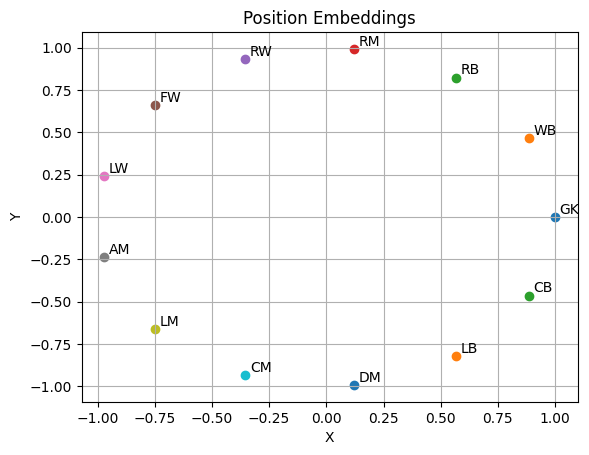

In [25]:
# Visualize position embeddings
import matplotlib.pyplot as plt
for pos, emb in position_embeddings.items():
    plt.scatter(emb[0], emb[1])
    plt.text(emb[0]+0.02, emb[1]+0.02, pos)
plt.title('Position Embeddings')
plt.xlabel('X')
plt.ylabel('Y')
plt.grid()
plt.show()

In [129]:
xdf[:5].apply(add_position_embedding, axis=1)

0      [0.5680647467311559, 0.8229838658936564]
1    [-0.35460488704253545, 0.9350162426854148]
2                                    [1.0, 0.0]
3     [-0.7485107481711013, -0.663122658240795]
4     [-0.6627733522342938, 0.5871659534864863]
dtype: object

In [27]:
# convert pos to 2D embedding
position_embeds = xdf.apply(add_position_embedding, axis=1)
xdf['pos_x'] = position_embeds.apply(lambda x: x[0])
xdf['pos_y'] = position_embeds.apply(lambda x: x[1])

In [28]:
xdf.shape

(11568, 31)

In [29]:
# string cols and numeric cols
string_cols = ['Pos', 'player_name', 'match_id', 'team']
numeric_cols = [col for col in xdf.columns if col not in string_cols]

In [26]:
# normalize numeric cols
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()

In [44]:
numeric_cols

['Min',
 'Gls',
 'Ast',
 'PK',
 'PKatt',
 'Sh',
 'SoT',
 'CrdY',
 'CrdR',
 'Touches',
 'Tkl',
 'Int',
 'Blocks',
 'xG',
 'npxG',
 'xAG',
 'SCA',
 'GCA',
 'Cmp',
 'Att',
 'Cmp%',
 'PrgP',
 'Carries',
 'PrgC',
 'is_starting',
 'pos_x',
 'pos_y']

In [38]:
xdf.drop([12774], inplace=True)

In [46]:
for c in numeric_cols:
    xdf[c] = pd.to_numeric(xdf[c], errors='coerce')

In [47]:
xdf[numeric_cols] = scaler.fit_transform(xdf[numeric_cols].astype(float))

In [48]:
xdf[numeric_cols]

,Min,Gls,Ast,PK,PKatt,Sh,SoT,CrdY,CrdR,Touches,...,GCA,Cmp,Att,Cmp%,PrgP,Carries,PrgC,is_starting,pos_x,pos_y
0,1.000000,0.00,0.000000,0.0,0.0,0.222222,0.2,0.0,0.0,0.301136,...,0.000000,0.233129,0.045455,0.826,0.200000,0.270492,0.000000,1.0,0.780848,0.914514
1,0.876404,0.25,0.333333,0.0,0.0,0.555556,0.6,0.5,0.0,0.215909,...,0.166667,0.122699,0.045455,0.800,0.166667,0.204918,0.173913,1.0,0.312712,0.970942
2,1.000000,0.00,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.215909,...,0.000000,0.171779,0.000000,0.757,0.000000,0.213115,0.000000,1.0,1.000000,0.500000
3,0.932584,0.00,0.000000,0.0,0.0,0.111111,0.0,0.0,0.0,0.221591,...,0.000000,0.159509,0.000000,0.839,0.266667,0.163934,0.043478,1.0,0.112855,0.166003
4,0.056180,0.00,0.000000,0.0,0.0,0.000000,0.0,0.5,0.0,0.039773,...,0.000000,0.024540,0.000000,1.000,0.000000,0.024590,0.043478,0.0,0.112855,0.833997
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13069,0.213483,0.00,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.079545,...,0.000000,0.073620,0.000000,0.857,0.000000,0.040984,0.000000,0.0,0.941884,0.265932
13070,0.662921,0.00,0.000000,0.0,0.0,0.000000,0.0,0.5,0.0,0.147727,...,0.000000,0.085890,0.000000,0.737,0.033333,0.090164,0.000000,1.0,0.312712,0.029058
13071,1.000000,0.00,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.244318,...,0.000000,0.165644,0.045455,0.964,0.066667,0.147541,0.000000,1.0,0.941884,0.265932
13072,0.662921,0.00,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.079545,...,0.000000,0.036810,0.272727,0.857,0.000000,0.057377,0.043478,1.0,0.112855,0.833997


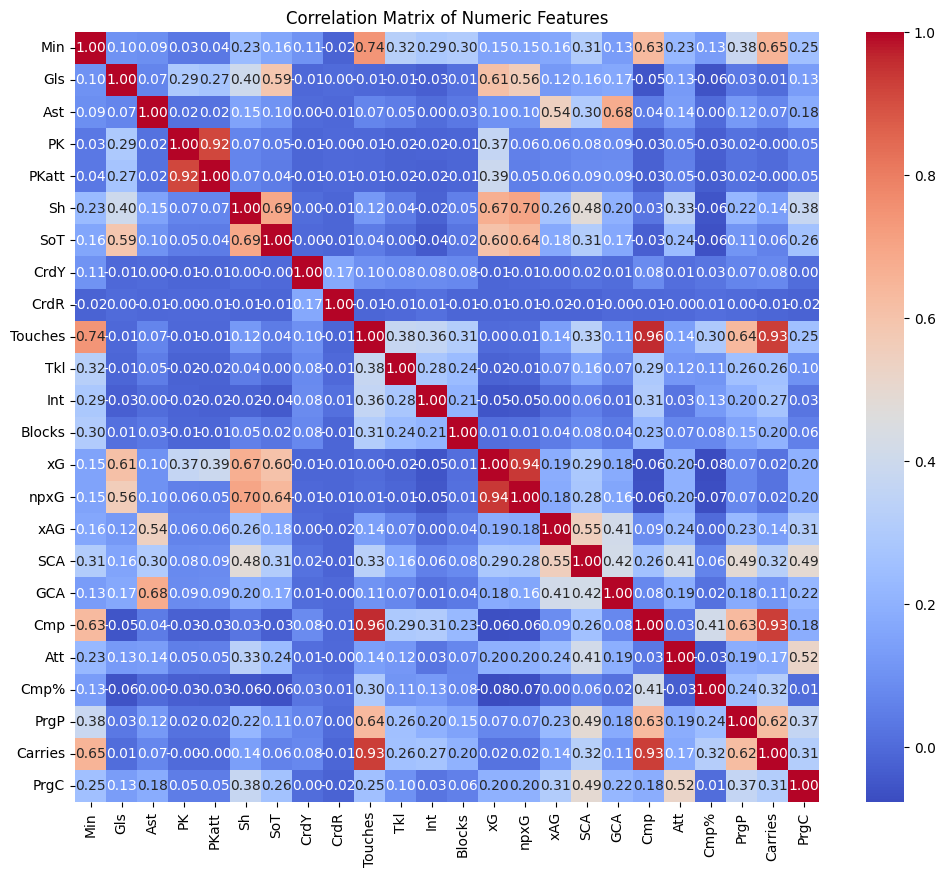

In [49]:
# see correlation matrix
import seaborn as sns
import matplotlib.pyplot as plt
numeric_cols.remove('is_starting')  # remove binary feature for correlation matrix
numeric_cols.remove('pos_x')
numeric_cols.remove('pos_y')
plt.figure(figsize=(12,10))
corr = xdf[numeric_cols].corr()
sns.heatmap(corr, annot=True, fmt=".2f", cmap='coolwarm')
plt.title('Correlation Matrix of Numeric Features')
plt.show()

In [50]:
# CMP, Carries and Touches are highly correlated
# xG, npxG are highly correlated
numeric_cols.remove('Cmp')
numeric_cols.remove('Carries')
numeric_cols.remove('npxG')

In [51]:
numeric_cols.remove('Min')

In [52]:
numeric_cols = numeric_cols+ ['Min']

In [53]:
# the performance of above models is great because Gls and Asst are part of input features. We need to remove them for better generalization.
numeric_cols.remove('Gls')
numeric_cols.remove('Ast')
numeric_cols.remove('PK')
numeric_cols.remove('PKatt')

In [54]:
numeric_cols

['Sh',
 'SoT',
 'CrdY',
 'CrdR',
 'Touches',
 'Tkl',
 'Int',
 'Blocks',
 'xG',
 'xAG',
 'SCA',
 'GCA',
 'Att',
 'Cmp%',
 'PrgP',
 'PrgC',
 'Min']

In [55]:
xdf.head()

# add is home or away feature
def is_home(row):   
    if row['match_id'].endswith('_H'):
        return 1
    else:
        return 0

xdf['is_home'] = xdf.apply(is_home, axis=1)

In [56]:
xdf

,Pos,Min,Gls,Ast,PK,PKatt,Sh,SoT,CrdY,CrdR,...,PrgP,Carries,PrgC,player_name,match_id,team,is_starting,pos_x,pos_y,is_home
0,RB,1.000000,0.00,0.000000,0.0,0.0,0.222222,0.2,0.0,0.0,...,0.200000,0.270492,0.000000,Ben White,Arsenal_Wolves_1_20240817_H,Arsenal,1.0,0.780848,0.914514,1
1,RW,0.876404,0.25,0.333333,0.0,0.0,0.555556,0.6,0.5,0.0,...,0.166667,0.204918,0.173913,Bukayo Saka,Arsenal_Wolves_1_20240817_H,Arsenal,1.0,0.312712,0.970942,1
2,GK,1.000000,0.00,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.000000,0.213115,0.000000,David Raya,Arsenal_Wolves_1_20240817_H,Arsenal,1.0,1.000000,0.500000,1
3,LM,0.932584,0.00,0.000000,0.0,0.0,0.111111,0.0,0.0,0.0,...,0.266667,0.163934,0.043478,Declan Rice,Arsenal_Wolves_1_20240817_H,Arsenal,1.0,0.112855,0.166003,1
4,FW,0.056180,0.00,0.000000,0.0,0.0,0.000000,0.0,0.5,0.0,...,0.000000,0.024590,0.043478,Gabriel Jesus,Arsenal_Wolves_1_20240817_H,Arsenal,0.0,0.112855,0.833997,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13069,CB,0.213483,0.00,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.000000,0.040984,0.000000,Konstantinos Mavropanos,Tottenham_West Ham_8_20241019_H,West Ham,0.0,0.941884,0.265932,1
13070,CM,0.662921,0.00,0.000000,0.0,0.0,0.000000,0.0,0.5,0.0,...,0.033333,0.090164,0.000000,Lucas Paquetá,Tottenham_West Ham_8_20241019_H,West Ham,1.0,0.312712,0.029058,1
13071,CB,1.000000,0.00,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.066667,0.147541,0.000000,Max Kilman,Tottenham_West Ham_8_20241019_H,West Ham,1.0,0.941884,0.265932,1
13072,FW,0.662921,0.00,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.000000,0.057377,0.043478,Michail Antonio,Tottenham_West Ham_8_20241019_H,West Ham,1.0,0.112855,0.833997,1


In [57]:
# we use all numeric cols plus pos_x and pos_y as features for model training
feature_cols = numeric_cols
other_cols = ['is_starting', 'pos_x', 'pos_y', 'is_home']

In [58]:
feature_cols, len(feature_cols)

(['Sh',
  'SoT',
  'CrdY',
  'CrdR',
  'Touches',
  'Tkl',
  'Int',
  'Blocks',
  'xG',
  'xAG',
  'SCA',
  'GCA',
  'Att',
  'Cmp%',
  'PrgP',
  'PrgC',
  'Min'],
 17)

In [59]:
# model v1 
# create a model using torch
# importing libraries
import torch
import torch.nn as nn

# add one dense layer with relu activation to dims 8
# for all players in a match take a weighted average of output layer with Min as weights for each player in that match
# after averaging, concat the output with same for other team for same match
# finally pass through another dense layer to get final output i.e. predicted score difference

# Model without positional awareness


In [60]:
feature_cols

['Sh',
 'SoT',
 'CrdY',
 'CrdR',
 'Touches',
 'Tkl',
 'Int',
 'Blocks',
 'xG',
 'xAG',
 'SCA',
 'GCA',
 'Att',
 'Cmp%',
 'PrgP',
 'PrgC',
 'Min']

In [90]:

class ScorePredictionModel(nn.Module):
    def __init__(self, feature_dim):
        super(ScorePredictionModel, self).__init__()
        self.player_fc = nn.Sequential(
            nn.Linear(feature_dim-1, 8),
            nn.ReLU()
        )
        self.final_fc = nn.Linear(16, 2)

    def apply_averaging(self, x):
        """
        x shape: (num_players, num_features + 1)
        where last column is 'Min' (minutes)
        """
        features = x[:, :-1]
        mins = x[:, -1].unsqueeze(1)  # shape: (num_players, 1)

        # pass features through player model
        out = self.player_fc(features)  # shape: (num_players, 8)

        # weighted average using minutes
        weighted_avg = (out * mins).sum(dim=0) / mins.sum()
        return weighted_avg  # shape: (8,)

    def concat_teams(self, team1_avg, team2_avg):
        return torch.cat((team1_avg, team2_avg), dim=-1)  # shape: (16,)

    def forward(self, team1_players, team2_players):
        team1_avg = self.apply_averaging(team1_players)
        team2_avg = self.apply_averaging(team2_players)
        combined = self.concat_teams(team1_avg, team2_avg).unsqueeze(0)  # shape: (1, 16)
        output = self.final_fc(combined)
        return output  # shape: (1, 1)

# Example usage
model = ScorePredictionModel(feature_dim=len(feature_cols))
# out = model(team1, team2)
# print(out)


In [62]:
print(model)

ScorePredictionModel(
  (player_fc): Sequential(
    (0): Linear(in_features=16, out_features=8, bias=True)
    (1): ReLU()
  )
  (final_fc): Linear(in_features=16, out_features=2, bias=True)
)


In [63]:
# count number of parameters
def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)
count_parameters(model)

170

In [71]:
xdf.fillna(10, inplace=True)

In [77]:
# for each match, we need to prepare team1 and team2 player tensors from xdf
# for example, for match_id = 'Arsenal_Wolves_1_20240817_H'
match_id = 'Arsenal_Wolves_1_20240817_H'
team1_name = 'Arsenal'
team2_name = 'Wolves'

# Prepare player tensors for each team
team1_players = xdf[(xdf['match_id'] == match_id) & (xdf['team'] == team1_name)]
team2_players = xdf[(xdf['match_id'] == match_id) & (xdf['team'] == team2_name)]

In [78]:
team1_players.shape, team2_players.shape

((14, 32), (16, 32))

In [87]:
# forward features through model
team1_tensor = torch.tensor(team1_players[feature_cols].values, dtype=torch.float32)
team2_tensor = torch.tensor(team2_players[feature_cols].values, dtype=torch.float32)
model(team1_tensor, team2_tensor)

tensor([[-0.2268,  0.1280]], grad_fn=<AddmmBackward0>)

In [88]:
model(team1_tensor, team2_tensor)

tensor([[-0.2268,  0.1280]], grad_fn=<AddmmBackward0>)

In [ ]:
# write a training loop for the model
# using MSE loss between predicted team 1 score and team 2 score

ydf['scoreline'] = ydf['scoreline'].apply(lambda x: list(map(int, x.replace('–','-').split('-'))))
ydf['team1_score'] = ydf['scoreline'].apply(lambda x: x[0])
ydf['team2_score'] = ydf['scoreline'].apply(lambda x: x[1])

In [80]:
ydf.isna().sum()

match_id        0
team1           0
team2           0
result_team1    0
scoreline       0
team1_score     0
team2_score     0
dtype: int64

In [91]:
# Training loop
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
criterion = nn.MSELoss()

# 80-20 train-test split
train_df = ydf.sample(frac=0.8, random_state=42)
test_df = ydf.drop(train_df.index)

for epoch in range(100):
    for i, row in train_df.iterrows():
        match_id = row['match_id']
        team1_name = row['team1']
        team2_name = row['team2']
        team1_players = xdf[(xdf['match_id'] == match_id) & (xdf['team'] == team1_name)]
        team2_players = xdf[(xdf['match_id'] == match_id) & (xdf['team'] == team2_name)]
        team1_tensor = torch.tensor(team1_players[feature_cols].values, dtype=torch.float32)
        team2_tensor = torch.tensor(team2_players[feature_cols].values, dtype=torch.float32)
        #print(team1_tensor.shape, team2_tensor.shape,team1_tensor,team2_tensor)

        # Forward pass
        optimizer.zero_grad()
        output = model(team1_tensor, team2_tensor)
        #print(output, torch.tensor([[row['team1_score'], row['team2_score']]], dtype=torch.float32))
        loss = criterion(output, torch.tensor([[row['team1_score'], row['team2_score']]], dtype=torch.float32))
        loss.backward()
        optimizer.step()
    if (epoch+1) % 10 == 0:
        print(f"Epoch [{epoch+1}/100], Loss: {loss.item():.4f}")
        # Evaluate on test set
        with torch.no_grad():
            test_losses = []
            for j, test_row in test_df.iterrows():
                match_id = test_row['match_id']
                team1_name = test_row['team1']
                team2_name = test_row['team2']
                team1_players = xdf[(xdf['match_id'] == match_id) & (xdf['team'] == team1_name)]
                team2_players = xdf[(xdf['match_id'] == match_id) & (xdf['team'] == team2_name)]
                team1_tensor = torch.tensor(team1_players[feature_cols].values, dtype=torch.float32)
                team2_tensor = torch.tensor(team2_players[feature_cols].values, dtype=torch.float32)

                output = model(team1_tensor, team2_tensor)
                test_loss = criterion(output, torch.tensor([[test_row['team1_score'], test_row['team2_score']]], dtype=torch.float32))
                test_losses.append(test_loss.item())
            avg_test_loss = sum(test_losses) / len(test_losses)
            print(f"Test Loss: {avg_test_loss:.4f}")

Epoch [10/100], Loss: 1.7516
Test Loss: 1.0162
Epoch [20/100], Loss: 0.8609
Test Loss: 0.5428
Epoch [30/100], Loss: 0.3238
Test Loss: 0.3286
Epoch [40/100], Loss: 0.1115
Test Loss: 0.2537
Epoch [50/100], Loss: 0.0476
Test Loss: 0.2263
Epoch [60/100], Loss: 0.0308
Test Loss: 0.2152
Epoch [70/100], Loss: 0.0240
Test Loss: 0.2110
Epoch [80/100], Loss: 0.0210
Test Loss: 0.2100
Epoch [90/100], Loss: 0.0196
Test Loss: 0.2102
Epoch [100/100], Loss: 0.0188
Test Loss: 0.2110


In [ ]:
# print model output and actual scoreline for all test matches with no_grad
test_results = []
for i, test_match in test_df.iterrows():
    match_id = test_match['match_id']
    team1_name = test_match['team1']
    team2_name = test_match['team2']
    team1_players = xdf[(xdf['match_id'] == match_id) & (xdf['team'] == team1_name)]
    team2_players = xdf[(xdf['match_id'] == match_id) & (xdf['team'] == team2_name)]
    team1_tensor = torch.tensor(team1_players[feature_cols].values, dtype=torch.float32)
    team2_tensor = torch.tensor(team2_players[feature_cols].values, dtype=torch.float32)
    with torch.no_grad():
        output = model(team1_tensor, team2_tensor)
    test_results.append((match_id,team1_name,team2_name, output.detach().numpy(), [test_match['team1_score'], test_match['team2_score']]))

In [219]:
pd.DataFrame(test_results, columns=['Match ID', 'Team 1', 'Team 2', 'Predicted', 'Actual']).to_csv('baseline_test_results.csv', index=False)

In [220]:
# save the model
torch.save(model.state_dict(), 'player_performance_model.pth')

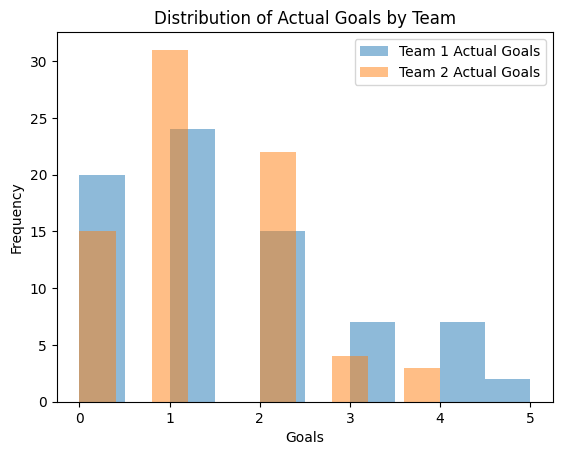

In [ ]:
# plot distribution of goals by team 1 and 2 to check for dataset imabalance
actual_goals = pd.DataFrame(test_results, columns=['Match ID', 'Team 1', 'Team 2', 'Predicted', 'Actual']).Actual
plt.hist([x[0] for x in actual_goals], alpha=0.5, label='Team 1 Actual Goals')
plt.hist([x[1] for x in actual_goals], alpha=0.5, label='Team 2 Actual Goals')
plt.xlabel('Goals')
plt.ylabel('Frequency')
plt.title('Distribution of Actual Goals by Team')
plt.legend()
plt.show()

In [92]:
# define a training loop function like the for loop above. Save the loss at the end of each epoch and test loss every 5 epochs.
# also check if test loss is decreasing or not increasing in which case either reduce learning rate or stop training

def train_model(model, train_df, test_df, xdf, feature_cols, num_epochs=100, patience=10, lr_schedule=None):

    optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
    criterion = nn.MSELoss()
    train_losses = []
    test_losses = []
    best_test_loss = float('inf')
    epochs_without_improvement = 0

    for epoch in range(num_epochs):
        epoch_loss = 0.0
        for i, row in train_df.iterrows():
            match_id = row['match_id']
            team1_name = row['team1']
            team2_name = row['team2']
            team1_players = xdf[(xdf['match_id'] == match_id) & (xdf['team'] == team1_name)]
            team2_players = xdf[(xdf['match_id'] == match_id) & (xdf['team'] == team2_name)]
            team1_tensor = torch.tensor(team1_players[feature_cols].values, dtype=torch.float32)
            team2_tensor = torch.tensor(team2_players[feature_cols].values, dtype=torch.float32)

            # Forward pass
            optimizer.zero_grad()
            output = model(team1_tensor, team2_tensor)
            loss = criterion(output, torch.tensor([[row['team1_score'], row['team2_score']]], dtype=torch.float32))
            loss.backward()
            optimizer.step()
            epoch_loss += loss.item()
        avg_epoch_loss = epoch_loss / len(train_df)
        train_losses.append(avg_epoch_loss)
            # Evaluate on test set
        with torch.no_grad():
            test_epoch_loss = 0.0
            for j, test_row in test_df.iterrows():
                match_id = test_row['match_id']
                team1_name = test_row['team1']
                team2_name = test_row['team2']
                team1_players = xdf[(xdf['match_id'] == match_id) & (xdf['team'] == team1_name)]
                team2_players = xdf[(xdf['match_id'] == match_id) & (xdf['team'] == team2_name)]
                team1_tensor = torch.tensor(team1_players[feature_cols].values, dtype=torch.float32)
                team2_tensor = torch.tensor(team2_players[feature_cols].values, dtype=torch.float32)

                output = model(team1_tensor, team2_tensor)
                test_loss = criterion(output, torch.tensor([[test_row['team1_score'], test_row['team2_score']]], dtype=torch.float32))
                test_epoch_loss += test_loss.item()
            avg_test_loss = test_epoch_loss / len(test_df)
            test_losses.append(avg_test_loss)
            print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {avg_epoch_loss:.4f}, Test Loss: {avg_test_loss:.4f}")
            # Early stopping check
            if lr_schedule:
                lr_schedule.step(avg_test_loss)

            if avg_test_loss < best_test_loss:
                best_test_loss = avg_test_loss
                epochs_without_improvement = 0
            else:
                epochs_without_improvement += 1
                if epochs_without_improvement >= patience:
                    print("Early stopping triggered.")
                    break
    return train_losses, test_losses

In [93]:
from torch.optim.lr_scheduler import ReduceLROnPlateau
scheduler = ReduceLROnPlateau(
    optimizer,
    mode='min',
    factor=0.5,
    patience=5,
    threshold=0.00001)

In [94]:

class ScorePredictionModelV2(nn.Module):
    def __init__(self, feature_dim):
        super(ScorePredictionModelV2, self).__init__()
        self.player_fc = nn.Sequential(
            nn.Linear(feature_dim-1, 4),
            nn.ReLU()
        )
        self.final_fc = nn.Linear(8, 2)

    def apply_averaging(self, x):
        """
        x shape: (num_players, num_features + 1)
        where last column is 'Min' (minutes)
        """
        features = x[:, :-1]
        mins = x[:, -1].unsqueeze(1)  # shape: (num_players, 1)

        # pass features through player model
        out = self.player_fc(features)  # shape: (num_players, 8)

        # weighted average using minutes
        weighted_avg = (out * mins).sum(dim=0) / mins.sum()
        return weighted_avg  # shape: (8,)

    def concat_teams(self, team1_avg, team2_avg):
        return torch.cat((team1_avg, team2_avg), dim=-1)  # shape: (16,)

    def forward(self, team1_players, team2_players):
        team1_avg = self.apply_averaging(team1_players)
        team2_avg = self.apply_averaging(team2_players)
        combined = self.concat_teams(team1_avg, team2_avg).unsqueeze(0)  # shape: (1, 16)
        output = self.final_fc(combined)
        return output  # shape: (1, 1)

# Example usage
model = ScorePredictionModelV2(feature_dim=len(feature_cols))


In [95]:
count_parameters(model)

86

In [96]:
train_losses, test_losses = train_model(
    model,
    train_df,
    test_df,
    xdf,
    feature_cols,
    num_epochs=200,
    patience=10,
    lr_schedule=scheduler
)

Epoch [1/200], Train Loss: 2.1151, Test Loss: 1.6274
Epoch [2/200], Train Loss: 1.5055, Test Loss: 1.5574
Epoch [3/200], Train Loss: 1.4795, Test Loss: 1.5190
Epoch [4/200], Train Loss: 1.4417, Test Loss: 1.4741
Epoch [5/200], Train Loss: 1.3998, Test Loss: 1.4260
Epoch [6/200], Train Loss: 1.3551, Test Loss: 1.3760
Epoch [7/200], Train Loss: 1.3091, Test Loss: 1.3259
Epoch [8/200], Train Loss: 1.2628, Test Loss: 1.2769
Epoch [9/200], Train Loss: 1.2171, Test Loss: 1.2292
Epoch [10/200], Train Loss: 1.1724, Test Loss: 1.1832
Epoch [11/200], Train Loss: 1.1290, Test Loss: 1.1388
Epoch [12/200], Train Loss: 1.0869, Test Loss: 1.0960
Epoch [13/200], Train Loss: 1.0461, Test Loss: 1.0547
Epoch [14/200], Train Loss: 1.0067, Test Loss: 1.0145
Epoch [15/200], Train Loss: 0.9684, Test Loss: 0.9755
Epoch [16/200], Train Loss: 0.9314, Test Loss: 0.9378
Epoch [17/200], Train Loss: 0.8953, Test Loss: 0.9008
Epoch [18/200], Train Loss: 0.8603, Test Loss: 0.8644
Epoch [19/200], Train Loss: 0.8264, T

In [97]:
# check learning rate value
for i, param_group in enumerate(optimizer.param_groups):
    print(f"Learning Rate for group {i}: {param_group['lr']}")

Learning Rate for group 0: 0.00025


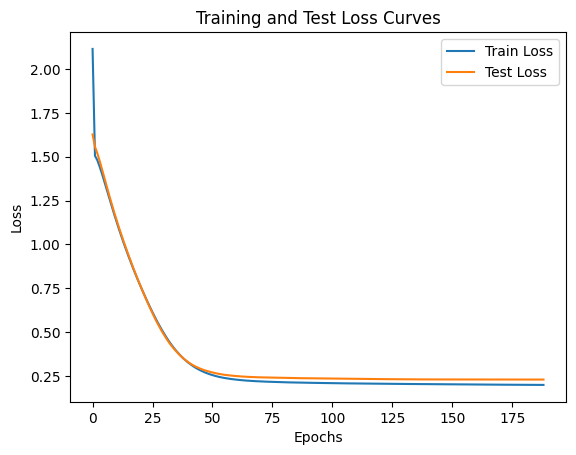

In [98]:
# print loss curves
plt.plot(train_losses, label='Train Loss')
plt.plot(test_losses, label='Test Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Test Loss Curves')
plt.legend()
plt.show()